# Chargement session

In [1]:
from pyspark import SparkConf
from pyspark.sql import SparkSession

In [2]:
import os
os.environ['PYSPARK_SUBMIT_ARGS'] = '--packages com.amazonaws:aws-java-sdk-pom:1.10.34,org.apache.hadoop:hadoop-aws:2.7.2 pyspark-shell'

In [3]:
#Set up SparkSession
spark = (SparkSession
         .builder.master('local[*]')
         .appName('images_preprocessing')
         .config('spark.hadoop.fs.s3a.access.key', 'mettre la cle daccésS3')
         .config('spark.hadoop.fs.s3a.secret.key', 'mettre la cle secret S3')
         .config('spark.hadoop.fs.s3a.impl', 'org.apache.hadoop.fs.s3a.S3AFileSystem')
         .getOrCreate()
        )

In [4]:
sc = spark.sparkContext
sc.setSystemProperty('com.amazonaws.services.s3.enableV4', 'true')
sc._jsc.hadoopConfiguration().set("fs.s3a.endpoint", "s3.us-east-2.amazonaws.com")

In [5]:

#Launch & access SparkContext
sc = spark.sparkContext.getOrCreate()
sc._jsc.hadoopConfiguration().set("fs.s3a.endpoint", "s3.us-east-2.amazonaws.com")



In [6]:
#import Spark
import findspark
findspark.init()
from pyspark import SparkContext, SparkConf
from pyspark.sql import SparkSession
from pyspark.ml.image import ImageSchema
S3=True
bucket_name='camarasouleymane'
path_local='fichier'

In [7]:


def init_spark_session(S3=False, bucket = '', path_local=''):
    '''Initie une session SPARK
    :s3 : booléen : True = Stockage S3, False = stockage local
    :return SparkContext'''

    if S3 is True:
        path_img = "s3a://"+bucket_name+"/train/*"
        
    else:
        path_img = path_local

    # Instantiation d'une SparkSession et d'un Spark Context
    #spark = SparkSession.builder.master('local[*]').appName('P8').getOrCreate()
    #sc = spark.sparkContext

    return sc, spark, path_img
    

In [8]:
#initialisation instance spark

sc, spark, path = init_spark_session(S3=S3, 
                                     bucket=bucket_name,
                                     path_local = path_local)
                                     

In [9]:
sc

<SparkContext master=local[*] appName=images_preprocessing>

In [10]:
spark

# Chargement des images 

In [11]:


#import pyspark
from pyspark import SQLContext
#from pyspark.ml.classification import LogisticRegression
from pyspark.ml.image import ImageSchema

#from pyspark.sql.functions import udf
from pyspark.sql.functions import input_file_name
from pyspark.sql.types import *
#import pyspark

In [12]:
def parse_categorie(path):
    '''Renvoie la catégorie d\'une image à partir de son chemin'''
    if len(path) > 0:
        #catégorie de l'image
        return path.split('/')[-2]
    else:
        return ''

In [13]:
parse_categorie('s3a://camarasouleymane/train/cherry/0.jpg')

'cherry'

In [14]:
import time 
def load_data(path_img):
    '''Chargement des dataframes: 
    Prend en entrée le répertoire qui contient les sous répertoires contenant les images
    Renvoie en sortie un spark dataframe contenant les images et 
    un spark dataframe contenant les noms des fruits associés'''
    #compteur
    start = time.time()
    #chargement dataframe des images
    
    

    df_img = spark.read.format("image").load(path_img,infershema=True) # ne fonctionne pas si il y a des espaces dans le chemin
    #df_img =  ImageSchema.readImages(path_img, dropImageFailures = True)
    print('chargement effectué')
    #récupération chemin à partir des images
    #df_img = df_img.withColumn("Lien", input_file_name())
    #catégorisation des images
    #udf_categorie = udf(parse_categorie, StringType())
   
    #df_img = df_img.withColumn('categorie', udf_categorie('image'))
    print('Temps de chargement des images : {} secondes'.format(time.strftime('%S', time.gmtime(time.time()-start))))
    
    return df_img

In [15]:
s3_url = "s3a://camarasouleymane/train/*"

In [16]:
image_data = spark.read.format("binaryFile").option("recursiveFileLookup", "true").load(s3_url)

In [19]:
type(image_data)

pyspark.sql.dataframe.DataFrame

In [20]:
image_data.printSchema()

root
 |-- path: string (nullable = true)
 |-- modificationTime: timestamp (nullable = true)
 |-- length: long (nullable = true)
 |-- content: binary (nullable = true)



In [18]:
image_data.count()

1476

# Sélection de la colonne binary

In [17]:
img = image_data.select('content').collect()

In [20]:
type(img)

list

Cette liste contient des objets de type Row qui correspondent à une ligne DataFrame. Les images y sont stockées sous la forme d'une chaine de caractères en encodage binaire du à la lecture sous forme de "binaryFile" des données d'origine

In [19]:
img

[Row(content=bytearray(b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\x02\x01\x01\x01\x01\x01\x02\x01\x01\x01\x02\x02\x02\x02\x02\x04\x03\x02\x02\x02\x02\x05\x04\x04\x03\x04\x06\x05\x06\x06\x06\x05\x06\x06\x06\x07\t\x08\x06\x07\t\x07\x06\x06\x08\x0b\x08\t\n\n\n\n\n\x06\x08\x0b\x0c\x0b\n\x0c\t\n\n\n\xff\xdb\x00C\x01\x02\x02\x02\x02\x02\x02\x05\x03\x03\x05\n\x07\x06\x07\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\xff\xc0\x00\x11\x08\x00d\x00d\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93

In [18]:
first_img = img[0][0]  # extraire la première image qui se trouve sur la première ligne et la première colonne

In [38]:
quatrieme=img[4][0]#la quatriéme image 

In [21]:
first_img

bytearray(b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\x02\x01\x01\x01\x01\x01\x02\x01\x01\x01\x02\x02\x02\x02\x02\x04\x03\x02\x02\x02\x02\x05\x04\x04\x03\x04\x06\x05\x06\x06\x06\x05\x06\x06\x06\x07\t\x08\x06\x07\t\x07\x06\x06\x08\x0b\x08\t\n\n\n\n\n\x06\x08\x0b\x0c\x0b\n\x0c\t\n\n\n\xff\xdb\x00C\x01\x02\x02\x02\x02\x02\x02\x05\x03\x03\x05\n\x07\x06\x07\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\xff\xc0\x00\x11\x08\x00d\x00d\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\

# Transformation des images en array

In [18]:
from PIL import Image
import numpy as np
import io as io
import requests
from skimage.transform import resize

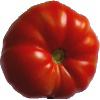

In [21]:
Image.open(io.BytesIO(first_img ))

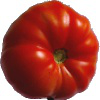

In [39]:
Image.open(io.BytesIO(quatrieme ))

In [19]:
binary_img_to_array = lambda rawdata: np.asarray(Image.open(io.BytesIO(rawdata[0])))

In [20]:
img_list = list(map(binary_img_to_array, img))

In [21]:
len(img_list)

1476

In [24]:
img_list[24].shape

(100, 100, 3)

In [26]:
from matplotlib import pyplot as plt
%matplotlib inline 

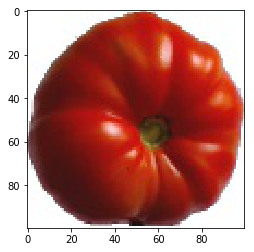

In [22]:
plt.imshow(img_list[0])
plt.show()

## Création de la classe des images 

In [49]:
#from pyspark.sql.functions import element_at,split
#spark_df=spark_df.withColumn('Classe',element_at(split(spark_df['image.origin'],'/'),-2))

In [65]:
#df['image'][0][-1]#data

In [56]:
#df['image'][0][0]#image

In [51]:
'''
import pyspark.sql.functions as F
from pyspark.ml.image import ImageSchema
from pyspark.ml.linalg import DenseVector, VectorUDT

ImageSchema.imageFields

img2vec = F.udf(lambda x: DenseVector(ImageSchema.toNDArray(x).flatten()), VectorUDT())
df = spark_df.withColumn('vecs', img2vec("image"))
df.show()
'''

'\nimport pyspark.sql.functions as F\nfrom pyspark.ml.image import ImageSchema\nfrom pyspark.ml.linalg import DenseVector, VectorUDT\n\nImageSchema.imageFields\n\nimg2vec = F.udf(lambda x: DenseVector(ImageSchema.toNDArray(x).flatten()), VectorUDT())\ndf = spark_df.withColumn(\'vecs\', img2vec("image"))\ndf.show()\n'

# Redimensionnement des images 

In [27]:
len(img_list)

1476

In [28]:
img_list[0].shape

(100, 100, 3)

In [22]:
from skimage.transform import resize
from keras.applications.vgg16 import preprocess_input

In [26]:
img_list[1475].shape

(100, 100, 3)

In [24]:
tmp_img2=resize(img_list[1475],output_shape=(224,224),order=2,anti_aliasing=True)
tmp_img2=np.expand_dims(tmp_img2,axis=0)
tmp_img2=preprocess_input(tmp_img2)

In [25]:
tmp_img2.shape

(1, 224, 224, 3)

In [29]:
len(img_list)

1476

In [26]:
batch_image=[]
for i in range(len(img_list)):
    tmp_img=resize(img_list[i],output_shape=(224,224),order=2,anti_aliasing=True)
    tmp_img=np.expand_dims(tmp_img,axis=0)
    tmp_img=preprocess_input(tmp_img)
    batch_image.append(tmp_img)
    
    

In [27]:
len(batch_image)

1476

In [31]:
batch_image[0].shape#le premier élément

(1, 224, 224, 3)

# Recherche des descripteurs grâce au TL

In [28]:
from keras.applications.vgg16 import VGG16 

In [29]:
#creation reseaux de neurones de mon modele de base
#taille de nos images 
IMG_SHAPE = (224,224,3)
base_model = VGG16(input_shape=IMG_SHAPE, include_top=False, pooling='avg', weights='imagenet')
#https://keras.io/api/applications/vgg/#vgg16-function
#input_shape=données d'entree
#include_top est ce que je veux rajouter quelque chose a la sortie rajouter dautres 
#couches
#pooling permet de limiter le nombre de features
#vgg16 sortait presque 100000 et faisait bugger l'acp

In [30]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [31]:
vgg16_feature=[]
for img in batch_image :
  feature_np=base_model.predict(img)
  vgg16_feature.append(feature_np.flatten())

In [32]:
vgg16_feature_np=np.array(vgg16_feature)
vgg16_feature_np.shape

(1476, 512)

In [33]:
vgg16_feature_np[0]

array([0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 1.2559600e-02, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       1.8137744e-02, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 1.3986364e-01, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 2.8752310e-02,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 1.3857709e-01,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e

In [34]:
vgg16_feature_np.shape

(1476, 512)

# Réalisation de l'ACP

In [35]:
# fonction qui trace le graphique des eboulis des valeurs propres
def display_scree_plot(pca):
    scree = pca.explained_variance_ratio_*100
    #plt.bar(np.arange(len(scree))+1, scree)
    plt.plot(np.arange(len(scree))+1, scree.cumsum(), c="red", marker='.')
    plt.xlabel("rang de l'axe d'inertie")
    plt.ylabel("pourcentage d'inertie")
    plt.title("Eboulis des valeurs propres")
    plt.show(block=False)

In [36]:
from sklearn import decomposition

In [37]:
n_comp=0.99#nombre de composantes maximum a calculer pour l'acp

In [38]:
pca=decomposition.PCA(n_components=n_comp)

In [39]:
feat_pca= pca.fit(vgg16_feature_np)#projection

In [41]:
import matplotlib.pyplot as plt

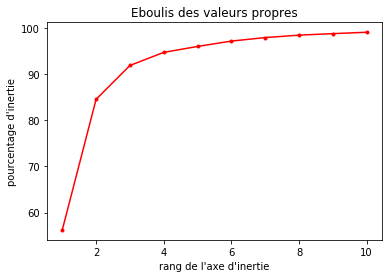

In [42]:
display_scree_plot(pca)

In [43]:
pca.explained_variance_ratio_.cumsum()
#pour les deux dimensions on est 0.19 de variance espliquée ce qui est
#vraiment bas 

array([0.5626222 , 0.8455991 , 0.9187539 , 0.9471371 , 0.9599407 ,
       0.9715796 , 0.9791467 , 0.98442787, 0.987706  , 0.99072003],
      dtype=float32)

In [44]:
print("Dimensions dataset avant réduction PCA : ", vgg16_feature_np.shape)
pca = decomposition.PCA(n_components=0.99)
feat_pca= pca.fit_transform(vgg16_feature_np)#projection
print("Dimensions dataset après réduction PCA : ", feat_pca.shape)

Dimensions dataset avant réduction PCA :  (1476, 512)
Dimensions dataset après réduction PCA :  (1476, 10)


In [45]:
feat_pca

array([[ 0.10283716,  0.16936494,  0.01375089, ...,  0.0007386 ,
         0.00939411, -0.01261475],
       [ 0.11282558,  0.12443124,  0.00049179, ..., -0.00365764,
         0.00130392, -0.0168252 ],
       [ 0.12685119,  0.11426081, -0.00530845, ..., -0.00643376,
         0.00152602, -0.01674346],
       ...,
       [-0.10645045,  0.04210783, -0.01727433, ..., -0.01337454,
        -0.00494433,  0.0112064 ],
       [-0.09972912,  0.07722363, -0.01134864, ..., -0.00128378,
        -0.01499717,  0.00402191],
       [-0.02245112,  0.0444258 , -0.00536861, ...,  0.00622467,
        -0.01144088, -0.00568933]], dtype=float32)

# Enrégistrement des projections 

In [48]:
import pandas as pd

In [49]:
df=pd.DataFrame(feat_pca)
df.to_csv('projection_image.csv')

In [50]:
df1 = spark.read.csv("projection_image.csv")
#https://www.geeksforgeeks.org/read-text-file-into-pyspark-dataframe/

In [51]:
df1.show()

+----+-----------+-----------+-------------+-----------+--------------+------------+-------------+-------------+--------------+-------------+
| _c0|        _c1|        _c2|          _c3|        _c4|           _c5|         _c6|          _c7|          _c8|           _c9|         _c10|
+----+-----------+-----------+-------------+-----------+--------------+------------+-------------+-------------+--------------+-------------+
|null|          0|          1|            2|          3|             4|           5|            6|            7|             8|            9|
|   0| 0.10283716| 0.16936494|   0.01375089|0.039401446|   -0.01422295|0.0036588956| -0.019247241| 0.0007386044|    0.00939411| -0.012614747|
|   1| 0.11282558| 0.12443124| 0.0004917855|0.033155486|  -0.012332141| 0.013051999| -0.021265104|-0.0036576372|  0.0013039194| -0.016825197|
|   2| 0.12685119| 0.11426081| -0.005308445|0.026523493|  -0.012325111| 0.012443028| -0.019837799| -0.006433755|  0.0015260227| -0.016743455|
|   3|

In [52]:
df1.write.format('csv').option('header','true').save('s3a://camarasouleymane/projection_image.csv',mode='overwrite')

# Réalisation d'une TSNE

In [53]:
from sklearn import manifold, decomposition

tsne = manifold.TSNE(n_components=2, perplexity=5, init='random')
X_tsne = tsne.fit_transform(feat_pca)

df_tsne = pd.DataFrame(X_tsne[:,0:2], columns=['tsne1', 'tsne2'])


In [55]:
import seaborn as sns

No handles with labels found to put in legend.


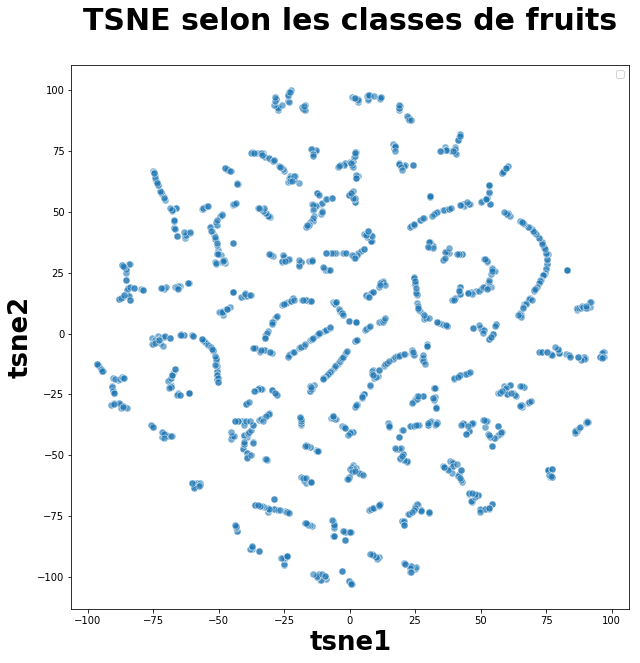

In [56]:
plt.figure(figsize=(10,10))
sns.scatterplot(
    x="tsne1", y="tsne2", data=df_tsne, legend="brief",
    palette=sns.color_palette('tab10', n_colors=5), s=50, alpha=0.6)

plt.title('TSNE selon les classes de fruits', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend() 
#plt.legend(prop={'size': 14})
plt.show()